In [144]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

pd.set_option('display.max_colwidth', None)
pd.set_option('display.max_columns', None)

In [15]:
csv_train = r'https://drive.usercontent.google.com/download?id=1RIKv1X_XWYAPCsmH6UPKOue3nHu1pkGJ&export=download&authuser=0'
csv_test = r'https://drive.usercontent.google.com/download?id=1dNHk0lq04yQDpfz3_lf4PX2rZEQWrHnp&export=download&authuser=0&confirm=t&uuid=668130f8-48df-4ba3-ac54-d187c7f65b60&at=AO7h07cWJg4cofkmU9mkqR7XAEl7:1724719828412'

train_raw = pd.read_csv(csv_train)
train_raw

,PassengerId,Survived,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked
0,1,0,3,"Braund, Mr. Owen Harris",male,22.0,1,0,A/5 21171,7.2500,NaN,S
1,2,1,1,"Cumings, Mrs. John Bradley (Florence Briggs Th...",female,38.0,1,0,PC 17599,71.2833,C85,C
2,3,1,3,"Heikkinen, Miss. Laina",female,26.0,0,0,STON/O2. 3101282,7.9250,NaN,S
3,4,1,1,"Futrelle, Mrs. Jacques Heath (Lily May Peel)",female,35.0,1,0,113803,53.1000,C123,S
4,5,0,3,"Allen, Mr. William Henry",male,35.0,0,0,373450,8.0500,NaN,S
...,...,...,...,...,...,...,...,...,...,...,...,...
886,887,0,2,"Montvila, Rev. Juozas",male,27.0,0,0,211536,13.0000,NaN,S
887,888,1,1,"Graham, Miss. Margaret Edith",female,19.0,0,0,112053,30.0000,B42,S
888,889,0,3,"Johnston, Miss. Catherine Helen ""Carrie""",female,NaN,1,2,W./C. 6607,23.4500,NaN,S
889,890,1,1,"Behr, Mr. Karl Howell",male,26.0,0,0,111369,30.0000,C148,C


In [113]:
train_raw_missing_values = train_raw.isnull().sum()
print(train_raw_missing_values[train_raw_missing_values > 0])

Age         177
Cabin       687
Embarked      2
dtype: int64


#### Missing values:
- Age: Let's use average value withing a given title and socio-economic status. E.g. Miss 3, 2, 1 have different avg ages.
- Cabin: I want to use Cabin to calculate number of people traveling together. But if cabin is missing, I plan to use number of people on the same ticket.
- Embarked: Only 2 values are missing, let's use most popular values to fill NaNs.

In [189]:
def parse_name(data):
    data = data.copy()
    
    data[['surname', 'title', 'name_2']] = data['Name'].str.extract(r'([^,]*), ([^.]*)\. (.*)')
    data['second_name'] = data['Name'].str.extract(r'.*\((.*)\).*')
    data['second_surname'] = data['second_name'].str.extract(r'.* ([A-Za-z]*)')
    
    surname_values = data['surname'].value_counts()    
    surname_values_ext = pd.concat([data['surname'], data['second_surname']]).reset_index(drop=True).value_counts()    
    data['people_per_surname'] = data['surname'].map(surname_values)
    data['people_per_surname_ext'] = data['surname'].map(surname_values_ext) + data['second_surname'].map(surname_values_ext).fillna(0).astype(int)    
    
    return data.drop(columns=['second_name', 'second_surname', 'name_2', 'Name'])


df = parse_name(train_raw)
x = df.groupby(['title', 'Pclass']).agg(
    avg_age=('Age', 'mean'),
    std_age=('Age', 'std'),
    count=('Age', 'size')
).reset_index()
x[x['count'] > 1]

,title,Pclass,avg_age,std_age,count
1,Col,1,58.000000,2.828427,2
3,Dr,1,43.750000,8.261356,5
4,Dr,2,38.500000,21.920310,2
7,Major,1,48.500000,4.949747,2
8,Master,1,5.306667,5.165475,3
9,Master,2,2.258889,2.342634,9
10,Master,3,5.350833,3.593608,28
11,Miss,1,30.000000,12.852308,46
12,Miss,2,22.390625,13.374708,34
13,Miss,3,16.123188,9.697315,102


array([[<Axes: title={'center': 'Age'}>]], dtype=object)

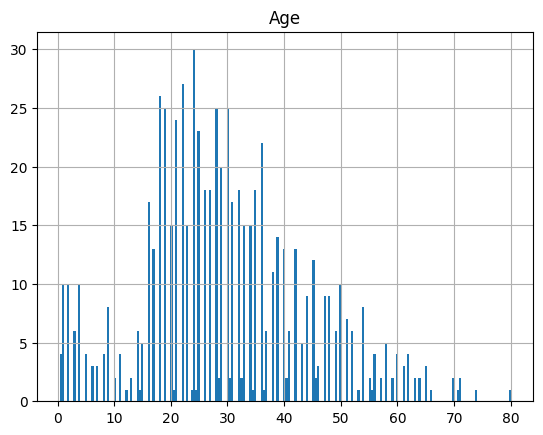

In [195]:
df.hist(column='Age', bins=200)

In [201]:
def enhance_features(data):
    data = parse_name(data)
    
    ticket_values = data['Ticket'].value_counts()
    data['people_per_ticket'] = data['Ticket'].map(ticket_values)
    
    cabin_values = data['Cabin'].value_counts()
    data['people_per_cabin'] = data['Cabin'].map(cabin_values).fillna(data['people_per_ticket']).astype(int) # If no data about cabin, get number of people per ticket
    
    data['people_per_family'] = data['SibSp'] + data['Parch'] + 1
    
    top_embarked = data['Embarked'].value_counts().index[0]
    data['Embarked'] = data['Embarked'].fillna(top_embarked)
    
    avg_age = data.groupby(['title', 'Pclass'])['Age'].mean().reset_index()    
    data['Age'] = data.apply(lambda x: avg_age[(avg_age['title'] == x['title']) & (avg_age['Pclass'] == x['Pclass'])]['Age'].values[0] if np.isnan(x['Age']) else x['Age'], axis=1)
    
    bin_edges = [0, 5, 10, 20, 30, 40, 50, 60, np.inf]
    data['age_bin'] = pd.cut(data['Age'], bins=bin_edges, right=False)

    # data['age_bin'] = (data['Age']/10).round().astype(int)
    
    # data[['cabin_letter', 'cabin_number']] = data['Cabin'].str.extract(r'([A-Za-z]*)(\d*)')
    # data['ticket_prefix'] = data['Ticket'].str.extract(r'(.*) \d*')
    # data['ticket_number'] = data['Ticket'].str.extract(r'.* (\d*)')
    
    data.set_index('PassengerId', inplace=True)
    
    return data.drop(columns=['SibSp', 'Parch', 'Ticket', 'Cabin', 'Age'])

train_X = enhance_features(train_raw.drop(columns=['Survived']))
train_y = train_raw['Survived']

train_X

,Pclass,Sex,Fare,Embarked,Age_bin,surname,title,people_per_surname,people_per_surname_ext,people_per_ticket,people_per_cabin,people_per_family,age_bin
PassengerId,,,,,,,,,,,,,
1,3,male,7.2500,S,"[20.0, 30.0)",Braund,Mr,2,2,1,1,2,"[20.0, 30.0)"
2,1,female,71.2833,C,"[30.0, 40.0)",Cumings,Mrs,1,5,1,1,2,"[30.0, 40.0)"
3,3,female,7.9250,S,"[20.0, 30.0)",Heikkinen,Miss,1,1,1,1,1,"[20.0, 30.0)"
4,1,female,53.1000,S,"[30.0, 40.0)",Futrelle,Mrs,2,3,2,2,2,"[30.0, 40.0)"
5,3,male,8.0500,S,"[30.0, 40.0)",Allen,Mr,2,2,1,1,1,"[30.0, 40.0)"
...,...,...,...,...,...,...,...,...,...,...,...,...,...
887,2,male,13.0000,S,"[20.0, 30.0)",Montvila,Rev,1,1,1,1,1,"[20.0, 30.0)"
888,1,female,30.0000,S,"[10.0, 20.0)",Graham,Miss,3,3,1,1,1,"[10.0, 20.0)"
889,3,female,23.4500,S,NaN,Johnston,Miss,2,2,2,2,4,"[10.0, 20.0)"


array([[<Axes: title={'center': 'Age'}>]], dtype=object)

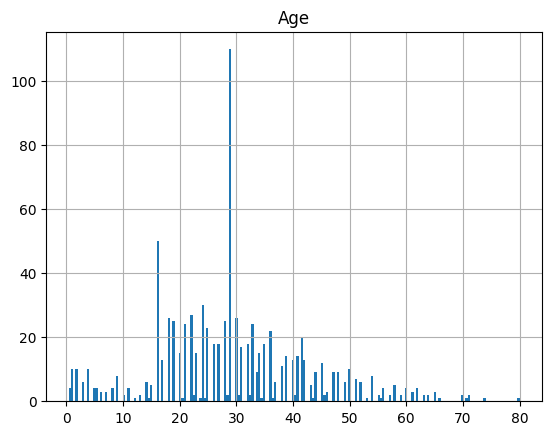

In [199]:
data = train_raw

data

,PassengerId,Survived,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked,Age_bin
0,1,0,3,"Braund, Mr. Owen Harris",male,22.0,1,0,A/5 21171,7.2500,NaN,S,"[20.0, 30.0)"
1,2,1,1,"Cumings, Mrs. John Bradley (Florence Briggs Thayer)",female,38.0,1,0,PC 17599,71.2833,C85,C,"[30.0, 40.0)"
2,3,1,3,"Heikkinen, Miss. Laina",female,26.0,0,0,STON/O2. 3101282,7.9250,NaN,S,"[20.0, 30.0)"
3,4,1,1,"Futrelle, Mrs. Jacques Heath (Lily May Peel)",female,35.0,1,0,113803,53.1000,C123,S,"[30.0, 40.0)"
4,5,0,3,"Allen, Mr. William Henry",male,35.0,0,0,373450,8.0500,NaN,S,"[30.0, 40.0)"
...,...,...,...,...,...,...,...,...,...,...,...,...,...
886,887,0,2,"Montvila, Rev. Juozas",male,27.0,0,0,211536,13.0000,NaN,S,"[20.0, 30.0)"
887,888,1,1,"Graham, Miss. Margaret Edith",female,19.0,0,0,112053,30.0000,B42,S,"[10.0, 20.0)"
888,889,0,3,"Johnston, Miss. Catherine Helen ""Carrie""",female,NaN,1,2,W./C. 6607,23.4500,NaN,S,NaN
889,890,1,1,"Behr, Mr. Karl Howell",male,26.0,0,0,111369,30.0000,C148,C,"[20.0, 30.0)"


In [47]:
# python.exe -m pip install --upgrade pip
# pip install ydata-profiling, ipywidgets

from ydata_profiling import ProfileReport
report = ProfileReport(train, explorative=True)
report

Render HTML: 100%|██████████| 1/1 [00:03<00:00,  3.91s/it]


In [14]:
# train.value_counts()

PassengerId  Survived  Pclass  Name                                                  Sex     Age   SibSp  Parch  Ticket    Fare      Cabin  Embarked
2            1         1       Cumings, Mrs. John Bradley (Florence Briggs Thayer)   female  38.0  1      0      PC 17599  71.2833   C85    C           1
572          1         1       Appleton, Mrs. Edward Dale (Charlotte Lamson)         female  53.0  2      0      11769     51.4792   C101   S           1
578          1         1       Silvey, Mrs. William Baird (Alice Munger)             female  39.0  1      0      13507     55.9000   E44    S           1
582          1         1       Thayer, Mrs. John Borland (Marian Longstreth Morris)  female  39.0  1      1      17421     110.8833  C68    C           1
584          0         1       Ross, Mr. John Hugo                                   male    36.0  0      0      13049     40.1250   A10    C           1
                                                                                 

In [13]:
train_missing_values = train.isnull().sum()
print(train_missing_values[train_missing_values > 0])

Age         177
Cabin       687
Embarked      2
dtype: int64


In [ ]:

# test = pd.read_csv(csv_test)
# test

In [ ]:
# make a research on the data and determine the best way to handle missing values

# implement the best way to handle missing values
# implement the best way to handle categorical values (encoding)

In [ ]:
# define validation method
# use StratifiedKFold to split the data into folds or KFold if you don't need stratification

In [ ]:
# define the regression model
# define the hyperparameters grid
# define the grid search with cross validation using previously defined validation method
# train the model
# print the best hyperparameters
# print the best score on train and validation data, estimate the generalization error

In [ ]:
# define the decision tree model
# define the hyperparameters grid
# define the grid search with cross validation using previously defined validation method
# train the model
# print the best hyperparameters
# print the best score on train and validation data, estimate the generalization error

In [ ]:
# compare the results of the two models
# make a conclusion on which model is better and why

In [ ]:
# retrain the best models (both regression and DT) on the whole train data

In [ ]:
# load test data
# do the same preprocessing as for train data

# using retrained models make predictions on the test data for both regression and DT models
# save the predictions to a file
# upload the predictions to Kaggle and make a submission
# report the score you got and compare it with the score you got on the validation data
# make a conclusion on how well the models generalizes